<a href="https://colab.research.google.com/github/nebyu08/data_sc/blob/main/dog_breed_classifier_transfer_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ipython -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.0 MB/s eta 0:00:00


# import datasets from kaggle

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json


In [ ]:
!kaggle competitions download -c dog-breed-identification

 99% 681M/691M [00:06<00:00, 152MB/s]
100% 691M/691M [00:06<00:00, 116MB/s]


In [ ]:
!unzip /content/dog-breed-identification.zip -d my_data

Streaming output truncated to the last 5000 lines.
  inflating: my_data/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: my_data/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: my_data/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: my_data/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: my_data/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: my_data/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: my_data/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: my_data/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: my_data/train/83fad0718581a696132c96c166472627.jpg  
  inflating: my_data/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: my_data/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: my_data/train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: my_data/train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: my_data/train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: my_data/trai

# lets start our journey know that the datasets are loaded

## lets import the necessary *modules*

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

In [ ]:
print(tf.__version__)
print(hub.__version__)

2.12.0
0.14.0


In [ ]:
if tf.config.list_physical_devices("GPU"):
  print("there is one yay")
else:
  print("none at the moment")

there is one yay


# lets import the dataset in the form of tensors and their labels

In [ ]:
labels=pd.read_csv("/content/my_data/labels.csv")

In [ ]:
labels

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
labels.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: >

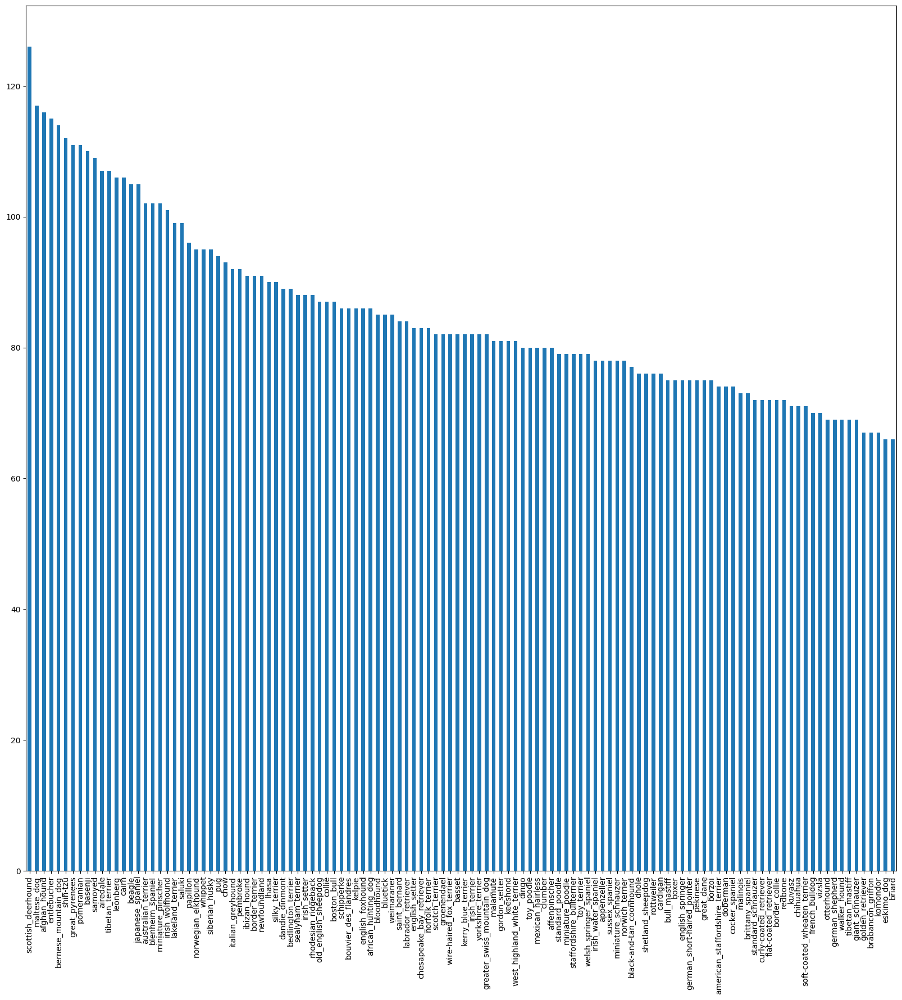

In [ ]:
labels["breed"].value_counts().plot.bar(figsize=(20,20))

In [ ]:
#lets calculate the mean or the averge in which an image is shown
labels['breed'].value_counts().mean()

85.18333333333334

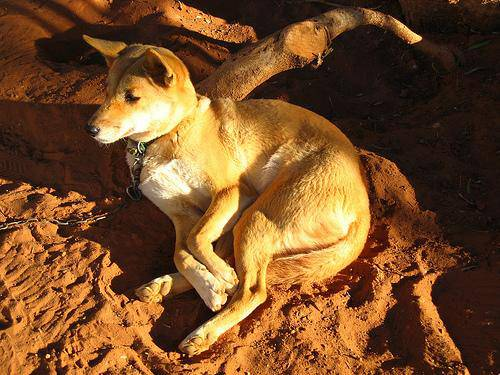

In [ ]:
from IPython.display import Image
Image('/content/my_data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

In [ ]:
# lets get the list of all train directory name
import os
filename=["/content/my_data/train/"+fname+'.jpg' for fname in labels["id"]]

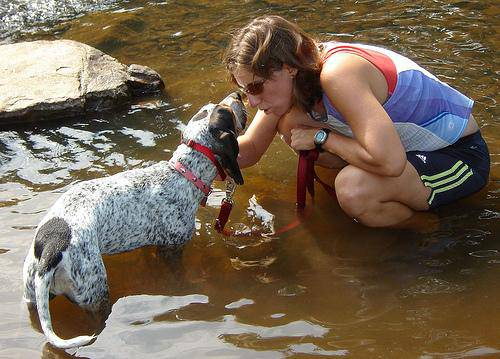

In [ ]:
Image(filename[3456])

In [ ]:
labels['breed'][3456]

'bluetick'

In [ ]:
# lets check for their size of the 2
if len(os.listdir("/content/my_data/train"))==len(filename):
  print("the size are equal")
else:
  print("their is a size difference")

the size are equal


In [ ]:
len(labels)

10222

In [ ]:
label_breed=labels["breed"].to_numpy()
label_breed[:5]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever'],
      dtype=object)

In [ ]:
len(label_breed)

10222

In [ ]:
#check for the number of labels and images
if (len(label_breed)==len(filename)):
  print("the sizes match between labels and file names")
else:
  print("there is a size miss match")

the sizes match between labels and file names


In [ ]:
unique_breed=np.unique(label_breed)
len(unique_breed)

120

In [ ]:
unique_breed

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
 print(label_breed[119])
 label_breed[119]==unique_breed

bluetick


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#lets turn the labels into boolean or into one hot encoded form
boolean_labels= [label== unique_breed for label in label_breed]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# turining boolean array into integers
print(label_breed[0])
print(np.where(unique_breed==label_breed[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(label_breed[9])
print(boolean_labels[9].astype(int))
print(boolean_labels[9].argmax())

scottish_deerhound
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
97


In [ ]:
# lets set up our variable x and y
x=filename
y=boolean_labels

In [ ]:
len(filename)

10222

In [ ]:
num_images= 1000 #@param {type:"slider", min:1000 , max:10000,step:1000}

In [ ]:
# lets split our data into trainging and validation set
x_train,x_val,y_train,y_val=train_test_split(x[:num_images],
                                               y[:num_images],
                                               test_size=0.2,
                                               random_state=42)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
# lets check it out
x_train[:5],y_train[:5]

(['/content/my_data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/my_data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/my_data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/my_data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/my_data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, Fal

# lets preprocess..turning images into tensors

In [ ]:
# convert image into numpy
from matplotlib.pyplot import imread
image=imread(filename[42])
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image.shape

(257, 350, 3)

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
tf.constant(image)[2]

<tf.Tensor: shape=(350, 3), dtype=uint8, numpy=
array([[ 56, 104,  66],
       [ 58, 106,  68],
       [ 64, 112,  74],
       ...,
       [ 71, 127,  82],
       [ 73, 129,  84],
       [ 74, 130,  85]], dtype=uint8)>

## lets write a function for preprocessing

In [ ]:
# write a function for preprocessing purposes
im_sz=224

def preprocess_image(image_path,img_size=im_sz):

  image = tf.io.read_file(image_path)

  #it decode the inputed jpeg image into tensors
  image = tf.image.decode_jpeg(image,channels=3)

  image= tf.image.convert_image_dtype(image,tf.float32)
  #resize
  image=tf.image.resize(image,size=[img_size,img_size])

  return image

In [ ]:
# and know create a function that return image and label
def get_image_label(image_path,label):
  '''
  returns the image and the labels
  '''
  image=preprocess_image(image_path)
  return image,label

In [ ]:
#demo  of the above functions
get_image_label(x[3],y[3])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.30236846, 0.29130402, 0.27799872],
         [0.34360996, 0.34351492, 0.3262655 ],
         [0.31875253, 0.32659566, 0.3069878 ],
         ...,
         [0.2709185 , 0.25207576, 0.17392443],
         [0.23924613, 0.2507305 , 0.19066878],
         [0.18908055, 0.21737191, 0.16485092]],
 
        [[0.28814277, 0.28281814, 0.26759955],
         [0.35677522, 0.3613971 , 0.34178925],
         [0.36211237, 0.3699555 , 0.35034767],
         ...,
         [0.25822112, 0.23287086, 0.16090952],
         [0.17731686, 0.17934492, 0.12220434],
         [0.19765677, 0.21964559, 0.16521132]],
 
        [[0.31258506, 0.31336036, 0.29532567],
         [0.37555525, 0.3801771 , 0.36056927],
         [0.38585186, 0.40503952, 0.38165018],
         ...,
         [0.27647328, 0.24687381, 0.17775612],
         [0.2189209 , 0.20857166, 0.14858504],
         [0.24111919, 0.2510632 , 0.19903237]],
 
        ...,
 
        [[0.49072814, 0.4326049 

In [ ]:
# turn data's into batches for training
batch_sz=32

def create_data_batches(x,y=None,batch_size=batch_sz,valid_data=False,test_data=False):
  '''
  create a batch size of type tensors for our machine learning model...
   and here y is set to none because we want it to flag to whether the data is
   training or validation set
  '''

  #if the data is test data we dont need the label of the data
  if test_data:
    print("creating a test data batches ...")
    data=tf.data.Datasets.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(preprocess_image).batch(batch_sz)
    return data_batch

  #if the data is validation set
  elif valid_data:
    print("creatig batch validation set ...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_sz)
    return data_batch
  #if the data is training datasets
  else:
    print("creating batch training set ...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    #lets shuffling the lables and pathnames not the images itself
    data=data.shuffle(buffer_size=len(x))

    #this creates image and tuple
    data=data.map(get_image_label)

    #turn the data into batches
    data_batch=data.batch(batch_sz)
    return data_batch


In [ ]:
#lets create training and validating data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

creating batch training set ...
creatig batch validation set ...


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# visualizing data in batches

In [ ]:
def show_25_images(images,labels):
  '''
   this function shows the first 25 images in an image batch
  '''
  plt.figure(figsize=(10,10))
  for i in range(25):

    #creating subplots
    ax=plt.subplot(5,5,i+1)

    #display an image
    plt.imshow(images[i])

    #add the label of the image
    plt.title(unique_breed[labels[i].argmax()])

    #turns of the grid
    plt.axis("off")

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())

In [ ]:
train_images,train_labels

(array([[[[0.34125605, 0.38047177, 0.34517762],
          [0.33407098, 0.3637541 , 0.3316375 ],
          [0.3626386 , 0.38145375, 0.3530248 ],
          ...,
          [0.23862438, 0.2503891 , 0.1837224 ],
          [0.23784696, 0.24961166, 0.182945  ],
          [0.23788276, 0.24964747, 0.1829808 ]],
 
         [[0.35806432, 0.38551533, 0.35414276],
          [0.37148815, 0.39258412, 0.36438906],
          [0.38157672, 0.3917833 , 0.365498  ],
          ...,
          [0.23274693, 0.24451163, 0.17784496],
          [0.22733806, 0.23910277, 0.17243609],
          [0.22815913, 0.23992383, 0.17325716]],
 
         [[0.34547296, 0.3650808 , 0.33762982],
          [0.35088262, 0.3641354 , 0.33668444],
          [0.3675811 , 0.3687541 , 0.34659895],
          ...,
          [0.234979  , 0.24674371, 0.18007703],
          [0.23466387, 0.24642858, 0.1797619 ],
          [0.23466387, 0.24642858, 0.1797619 ]],
 
         ...,
 
         [[0.2247024 , 0.23254554, 0.17764357],
          [0.14282

In [ ]:
len(train_images),len(train_labels)

(32, 32)

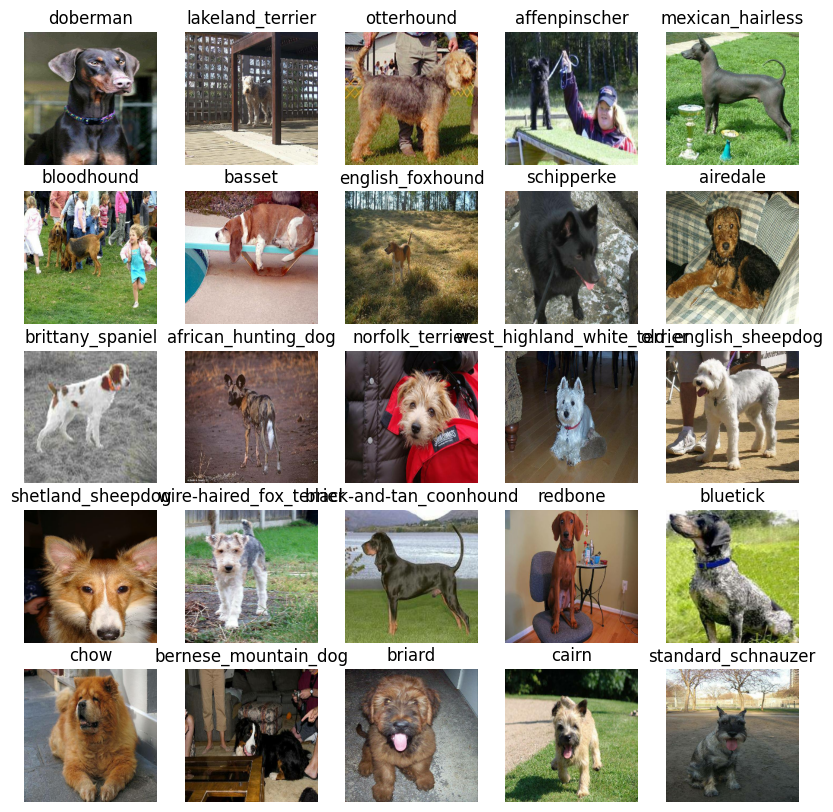

In [ ]:
#lets show the images
show_25_images(train_images,train_labels)

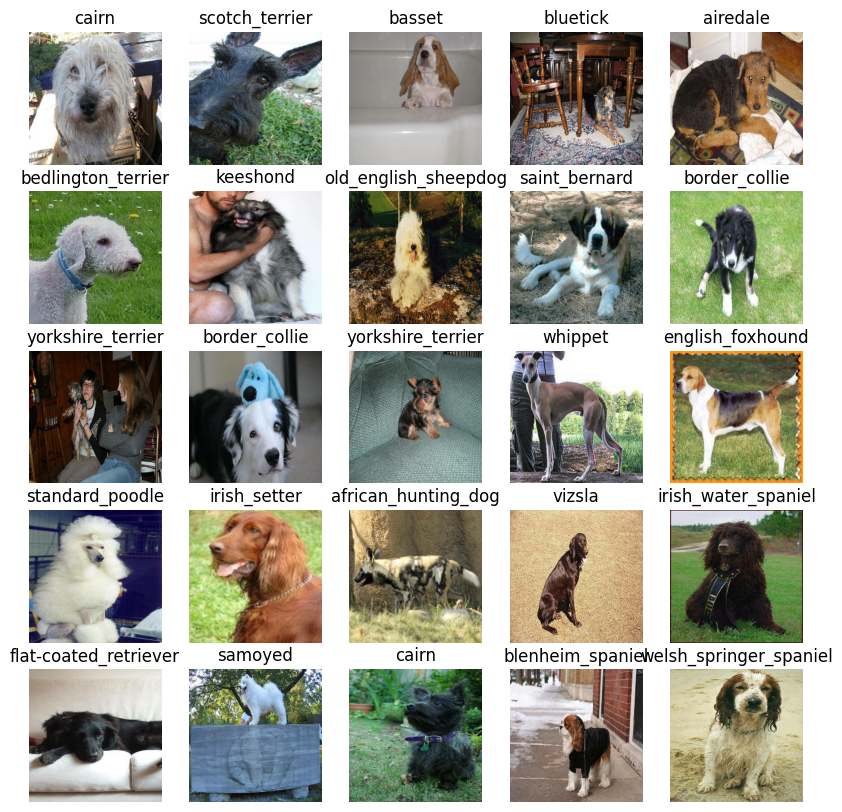

In [ ]:
# lets visualize our validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [ ]:
im_sz

224

In [ ]:
#this is the input shape
input_shape=[None,im_sz,im_sz,3]

#this is the output shape
output_shape=len(unique_breed)

#model url
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

 we are going to build the model and then evaluate it...the model is going to be
  a keras model

In [ ]:
  # create a model
  def build_model(INPUT_SHAPE=input_shape,OUTPUT_SHAPE=output_shape,model_url=MODEL_URL):
      print("build a model with:",MODEL_URL)

      model=tf.keras.Sequential([
          hub.KerasLayer(MODEL_URL),
          #output layer
          tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                activation="softmax")
      ])

      #compile the model
      model.compile(
          loss=tf.keras.losses.CategoricalCrossentropy(),
          optimizer=tf.keras.optimizers.Adam(),
          metrics=["accuracy"]
      )

      #build the model
      model.build(INPUT_SHAPE)

      return model

In [ ]:
model=build_model()
model.summary()

build a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# creat call-backs

## lets create tensorboard callbacks

In [ ]:
#load the tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os

#create tensorboard to build a tensorflow logs
def create_tensorboard_callbacks():
  logdir=os.path.join("/content/my_data/logs",
                      datetime.datetime.now().strftime("%y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stoping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                              patience=3)


In [ ]:
num_epochs=100

In [ ]:
def train_model():
  model=build_model()  #creates a model

  #this makes the tensor-board
  tensorboard=create_tensorboard_callbacks()

  #lets train the models
  model.fit(
      x=train_data,
      epochs=num_epochs,
      validation_data=val_data,
      validation_freq=1,
      callbacks=[tensorboard,early_stoping]
  )

  return model


In [ ]:
#create and fit the model
model=train_model()

build a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 16s 135ms/step - loss: 4.6152 - accuracy: 0.1000 - val_loss: 3.3975 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 2s 91ms/step - loss: 1.6364 - accuracy: 0.7000 - val_loss: 2.1027 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 3s 124ms/step - loss: 0.5726 - accuracy: 0.9287 - val_loss: 1.6241 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 3s 100ms/step - loss: 0.2571 - accuracy: 0.9812 - val_loss: 1.4531 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 2s 88ms/step - loss: 0.1482 - accuracy: 0.9962 - val_loss: 1.3773 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 2s 84ms/step - loss: 0.1013 - accuracy: 0.9987 - val_loss: 1.3275 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] -

In [ ]:
%tensorboard --logdir /content/my_data/logs

<IPython.core.display.Javascript object>

In [ ]:
prediction=model.predict(val_data,verbose=1)

7/7 [==============================] - 2s 108ms/step


In [ ]:
prediction.shape

(200, 120)

In [ ]:
prediction

array([[1.09633605e-03, 1.13967435e-04, 3.94130731e-03, ...,
        1.32414876e-04, 6.84927145e-05, 1.18599017e-03],
       [2.01292383e-03, 6.83350198e-04, 8.82116240e-03, ...,
        6.50400994e-04, 1.58644014e-03, 8.04338051e-05],
       [3.12519683e-06, 2.74355752e-05, 1.27595540e-05, ...,
        1.10594476e-04, 6.01758347e-06, 5.83589463e-05],
       ...,
       [1.08595020e-06, 6.46401031e-06, 9.61541009e-05, ...,
        5.06309789e-06, 5.12248007e-05, 5.93377399e-06],
       [7.20366079e-04, 2.02474825e-04, 2.03708565e-04, ...,
        9.00444684e-06, 2.35867592e-05, 6.26240158e-03],
       [7.07025814e-04, 1.02553340e-05, 5.27557684e-03, ...,
        3.44469771e-03, 2.15894077e-03, 1.20352546e-04]], dtype=float32)

In [ ]:
prediction[0]

array([1.09633605e-03, 1.13967435e-04, 3.94130731e-03, 2.48489319e-04,
       3.38438578e-04, 3.27491289e-05, 2.15467606e-02, 1.07745022e-04,
       9.41635735e-05, 2.24313975e-04, 4.35773516e-04, 8.43437883e-05,
       1.59213145e-04, 4.19403368e-05, 3.90387053e-04, 2.89206626e-04,
       8.89326839e-05, 3.22475225e-01, 2.08392339e-05, 5.24452189e-05,
       4.94218664e-04, 1.97068264e-04, 5.88468756e-05, 6.37407298e-04,
       5.28504779e-06, 1.96911395e-04, 3.36412787e-01, 2.67274794e-04,
       7.05974293e-04, 4.53170389e-04, 2.33487208e-05, 1.94790380e-04,
       2.70895136e-04, 7.26368089e-05, 6.88328291e-05, 1.83874145e-02,
       2.12005380e-05, 1.84183009e-04, 1.09793327e-04, 3.16926926e-05,
       9.89221968e-04, 6.48406713e-05, 1.05341394e-04, 8.06364333e-05,
       2.68392268e-05, 6.92368048e-05, 2.68942622e-05, 1.28999845e-05,
       1.71231470e-04, 5.89129340e-04, 1.16800955e-04, 1.18753618e-04,
       1.90122795e-04, 3.33769131e-04, 5.47860691e-05, 6.25102257e-05,
      

In [ ]:
np.argmax(prediction[0])

26

In [ ]:
unique_breed[np.argmax(prediction[0])]

'cairn'

In [ ]:
def get_pred_label(prediction_prob):
  return unique_breed[np.argmax(prediction_prob)]

In [ ]:
pred_label=get_pred_label(prediction[0])
pred_label

'cairn'

In [ ]:
def unbatch(data):
  """
  unbatch the data and their labels

  """
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images,labels

In [ ]:
#unbatch the validation set
val_image,val_label=unbatch(val_data)
val_image[0],val_label[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

In [ ]:
# View an example prediction, original image and truth label
#plot_pred(prediction_probabilities=predictions,
#          labels=val_label,
#          images=val_image)

NameError: ignored